# in this part
## image resize & scaling
## Arithmetic and Bitwise Operations
## Convolutions, Blurring and Sharpening Images
## Thresholding, Binarization & Adaptive Thresholding
## Dilation, Erosion and Edge Detection

In [3]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

def show(image=None,string='',size=10):
  width,hight=image.shape[:2]
  asp=width/hight
  plt.figure(figsize=(asp*size,size))
  plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
  plt.title(string)
  plt.show()


In [4]:
! wget https://moderncomputervision.s3.eu-west-2.amazonaws.com/images.zip
! unzip -qq images.zip

--2023-04-20 14:32:28--  https://moderncomputervision.s3.eu-west-2.amazonaws.com/images.zip
Resolving moderncomputervision.s3.eu-west-2.amazonaws.com (moderncomputervision.s3.eu-west-2.amazonaws.com)... 52.95.149.126
Connecting to moderncomputervision.s3.eu-west-2.amazonaws.com (moderncomputervision.s3.eu-west-2.amazonaws.com)|52.95.149.126|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 29586716 (28M) [application/zip]
Saving to: ‘images.zip’

images.zip          100%[===================>]  28.22M  6.76MB/s    in 4.2s    

2023-04-20 14:32:33 (6.76 MB/s) - ‘images.zip’ saved [29586716/29586716]



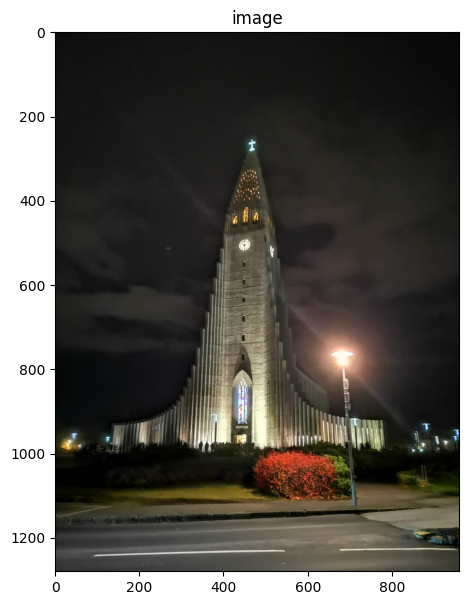

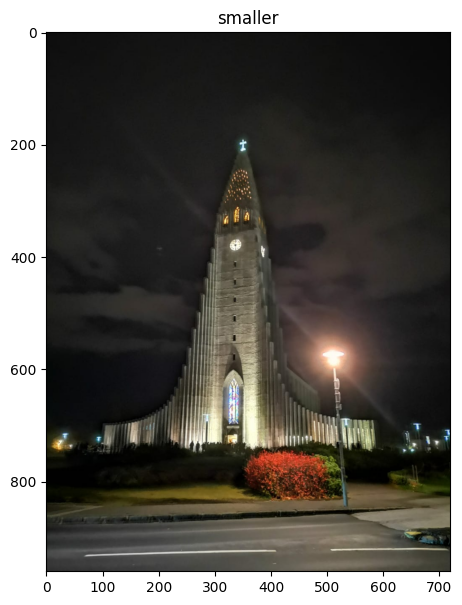

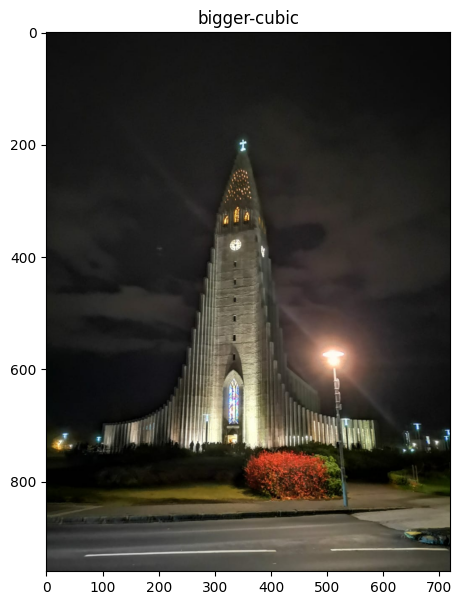

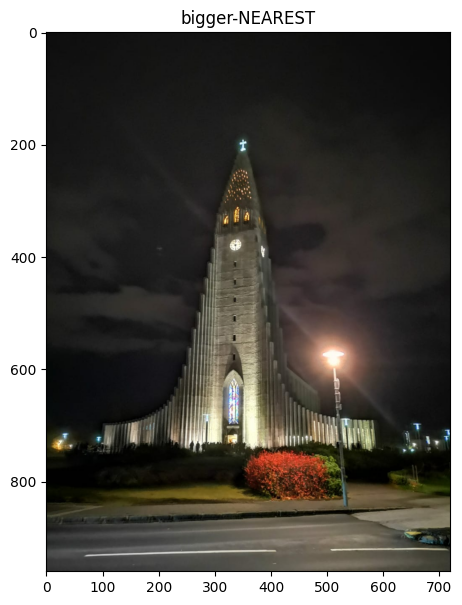

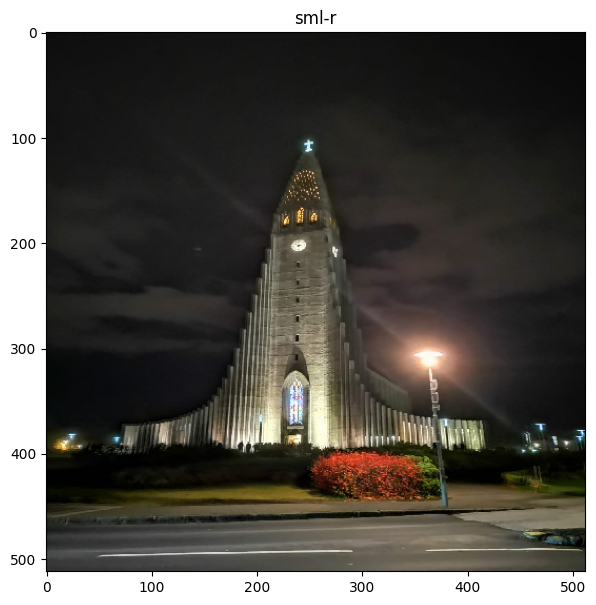

In [22]:
image=cv2.imread('/content/images/church_iceland.jpeg')
show(image,"image",7)
h,w=image.shape[:2]
smaller=cv2.resize(image,None,fx=0.75,fy=0.75)
show(smaller,"smaller",7)
bigger=cv2.resize(image,None,fx=2,fy=2,interpolation=cv2.INTER_CUBIC)
show(smaller,"bigger-cubic",7)
bigger=cv2.resize(image,None,fx=2,fy=2,interpolation=cv2.INTER_NEAREST)
show(smaller,"bigger-NEAREST",7)
diff=cv2.resize(image,(512,512),interpolation=cv2.INTER_NEAREST)
show(diff,"sml-r",7)

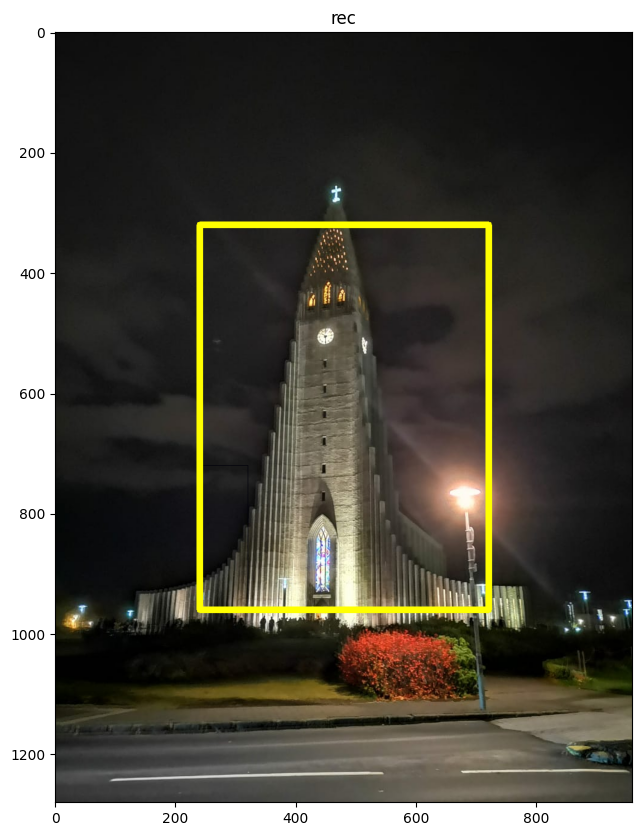

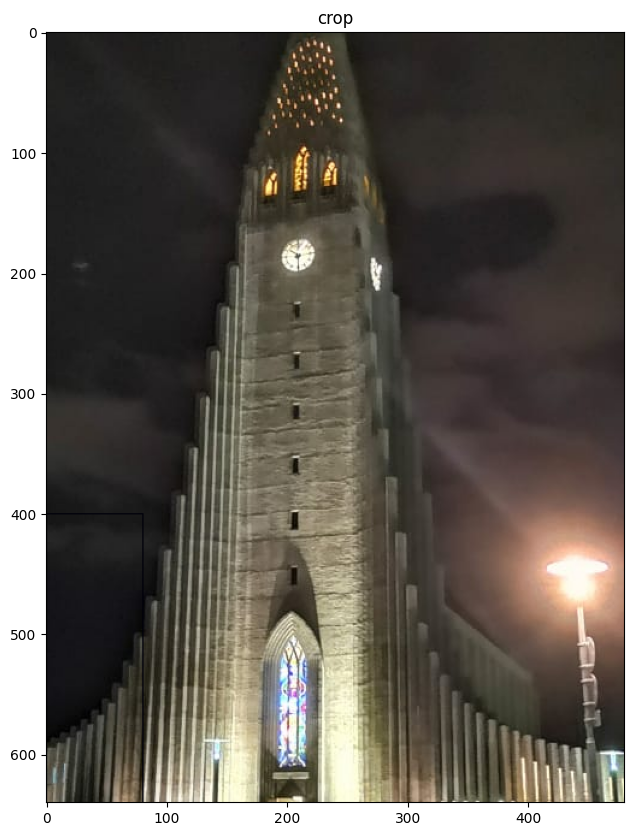

In [37]:
h,w=image.shape[:2]
start_h,finished_h=int(h*0.25),int(h*0.75)
start_w,finished_w=int(w*0.25),int(w*0.75)

cropped=image[start_h:finished_h,start_w:finished_w]
copy=image.copy()
#the part that we have cuted
cv2.rectangle(copy,(start_w,start_h),(finished_w,finished_h),(0,255,255),10)
show(copy,"rec")
#the part that we have cuted
show(cropped,"crop")

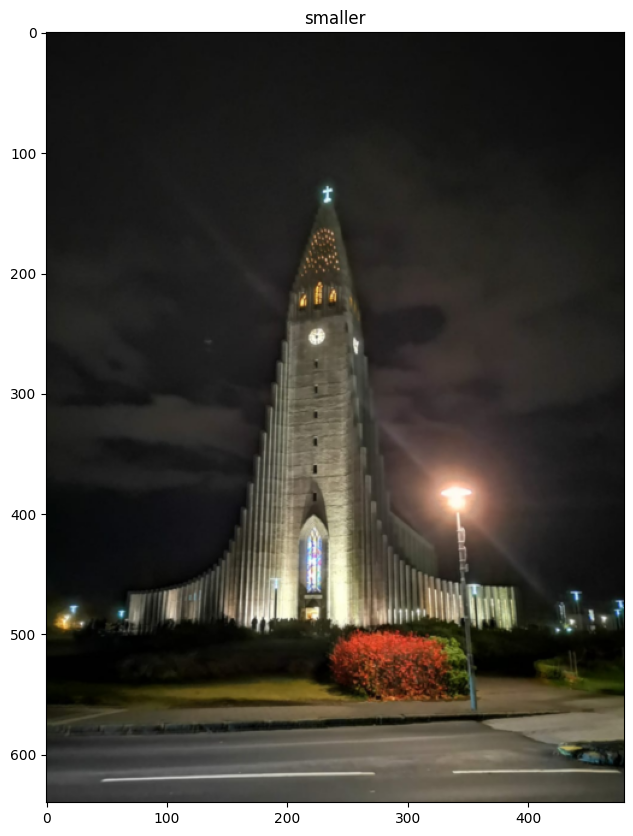

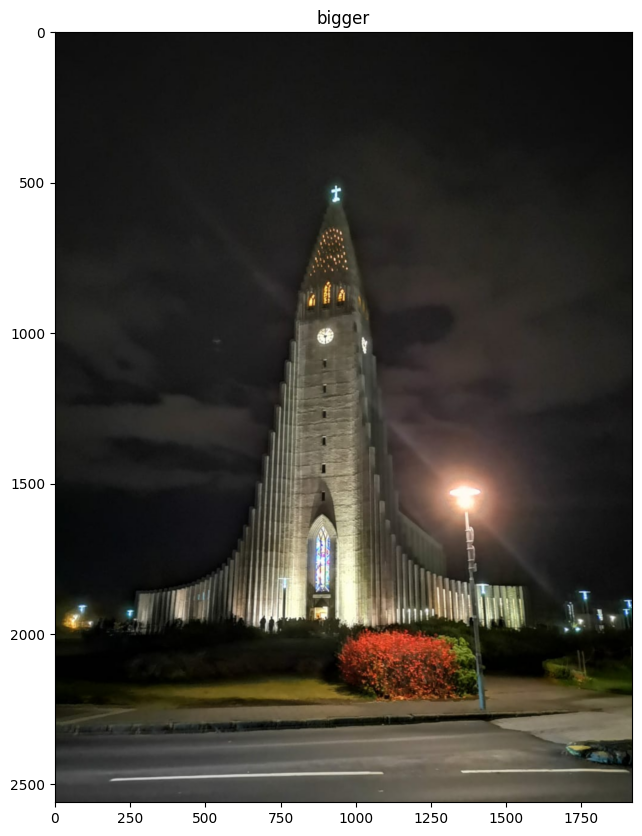

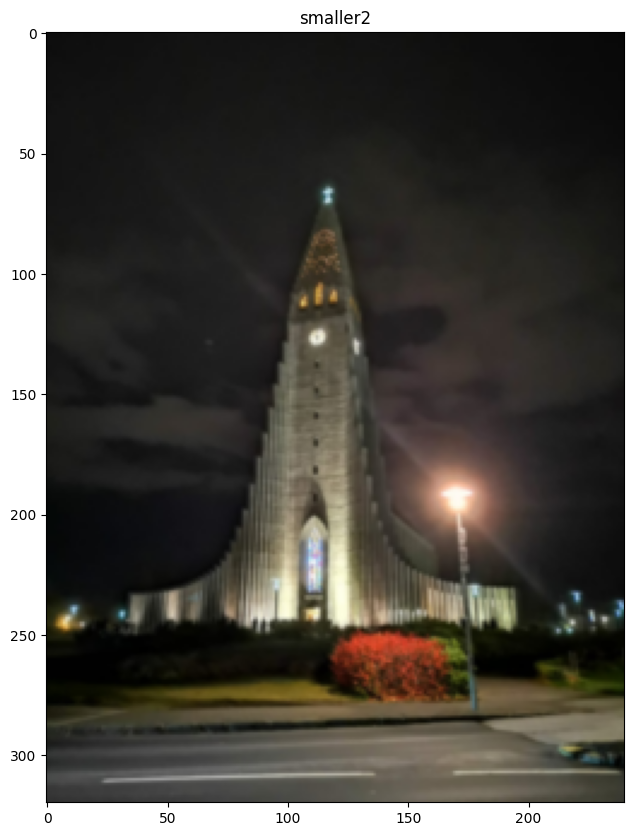

In [42]:
image=cv2.imread('/content/images/church_iceland.jpeg')
smaller=cv2.pyrDown(image,1)
show(smaller,"smaller")
bigger=cv2.pyrUp(image,1)
show(bigger,"bigger")
smaller2=cv2.pyrDown(smaller,1)
show(smaller2,"smaller2")

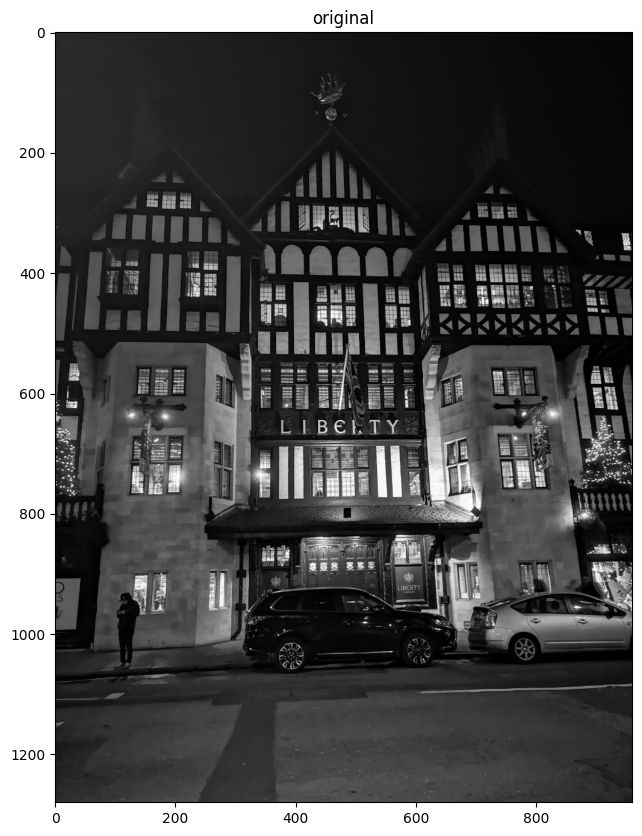

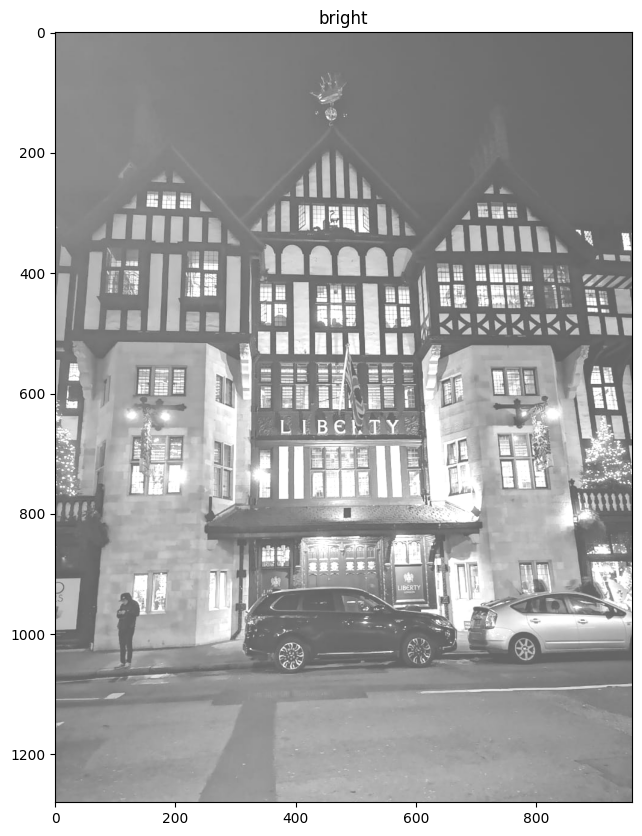

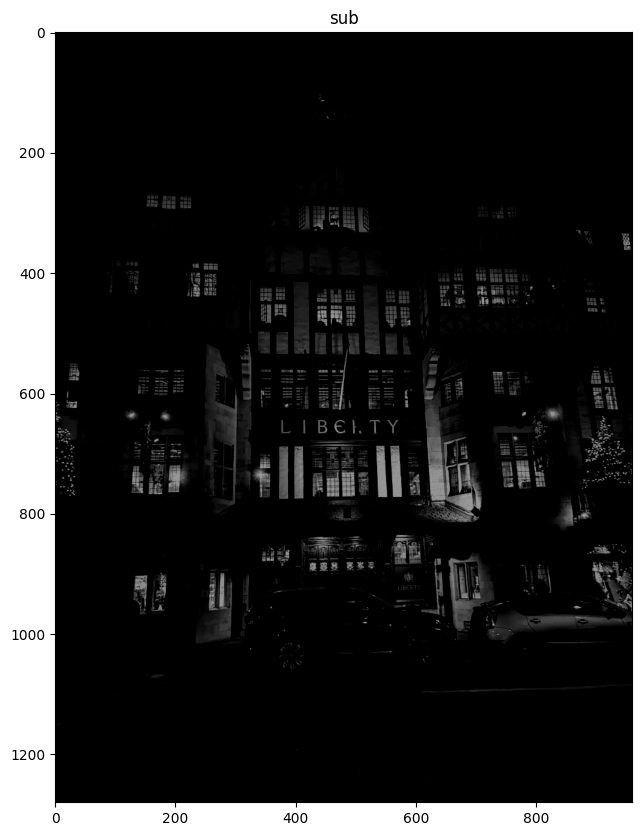

In [47]:
#reading_the photo in black and white
image=cv2.imread("/content/images/liberty.jpeg",0)
k=np.ones(image.shape,np.uint8)*100
br=cv2.add(image,k)
sb=cv2.subtract(image,k)
show(image,"original")
show(br,"bright")
show(sb,"sub")

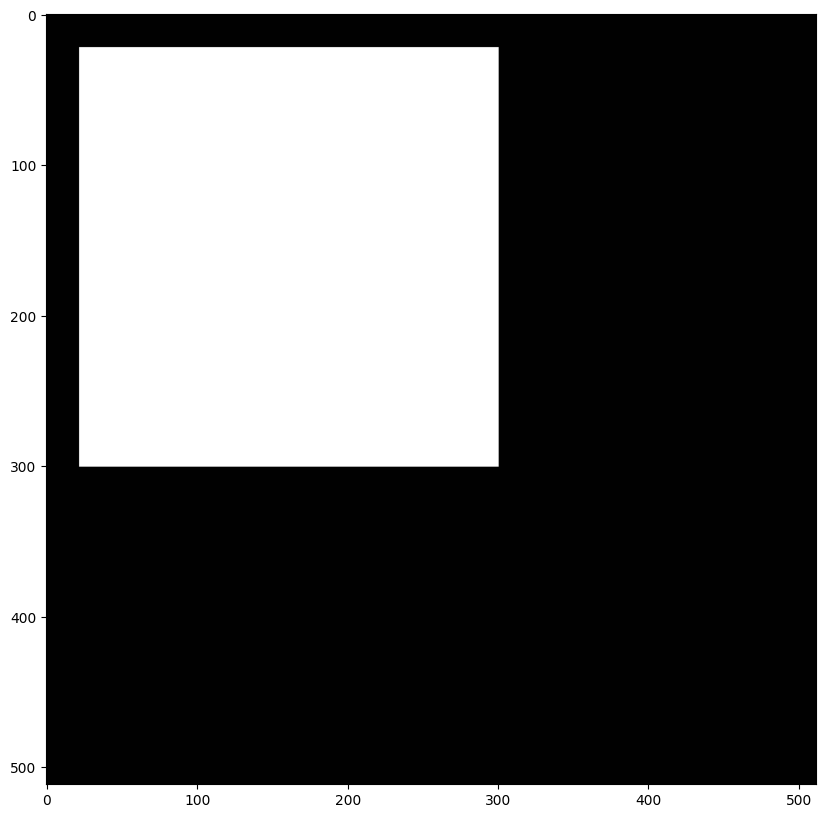

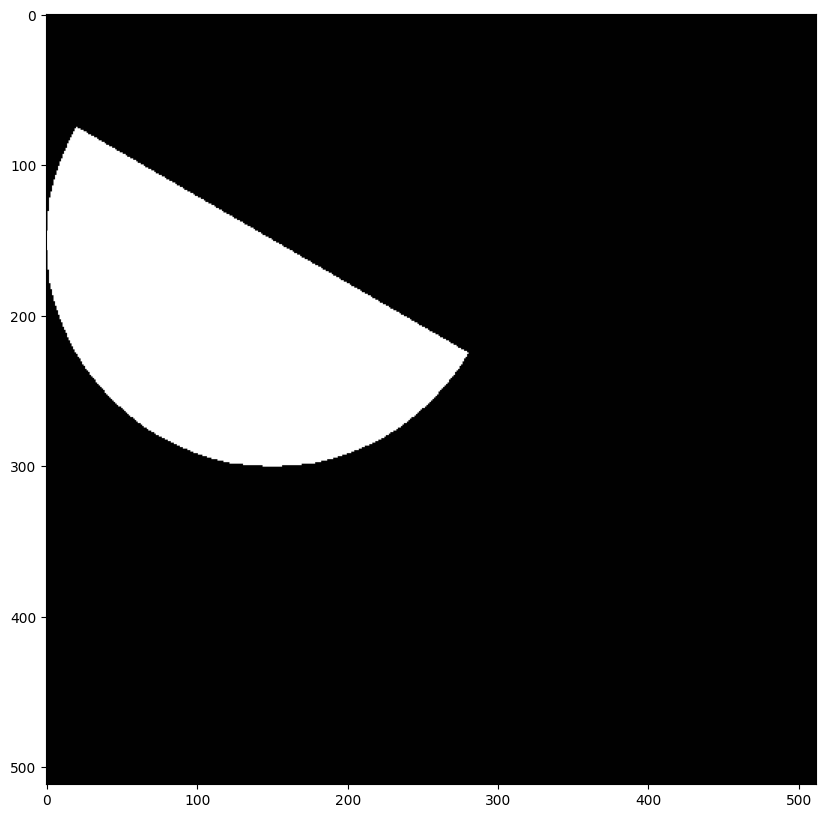

In [51]:
image=np.ones((512,512),np.uint8)
copy1=image.copy()
cv2.rectangle(copy1,(22,22),(300,300),(255,255,255),-1)
copy2=image.copy()
cv2.ellipse(copy2, (150, 150), (150, 150), 30, 0, 180, 255, -1)
show(copy1)
show(copy2)

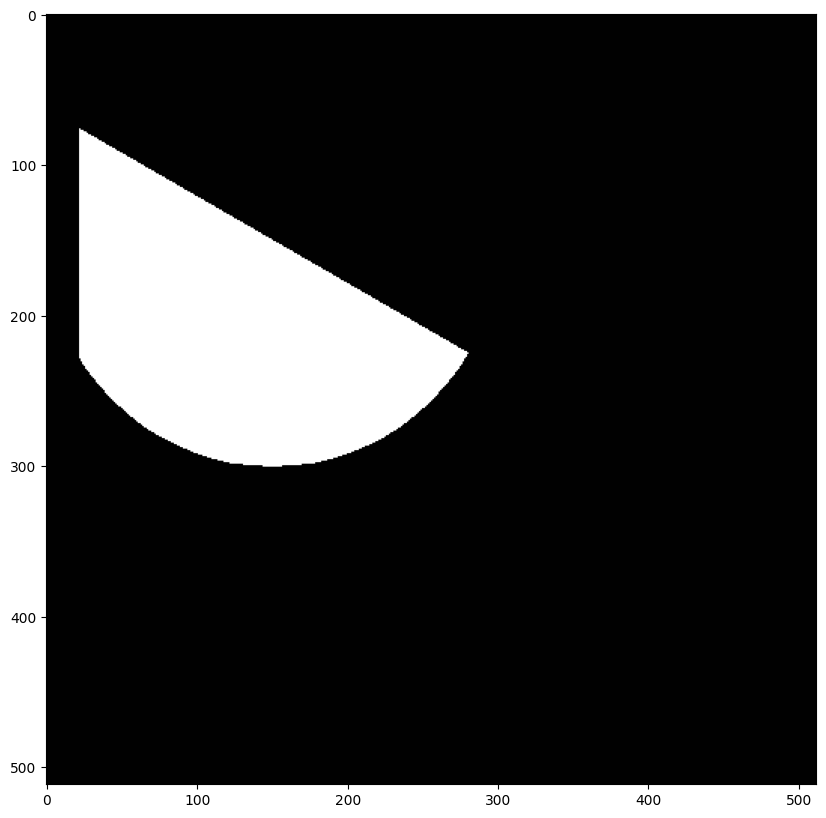

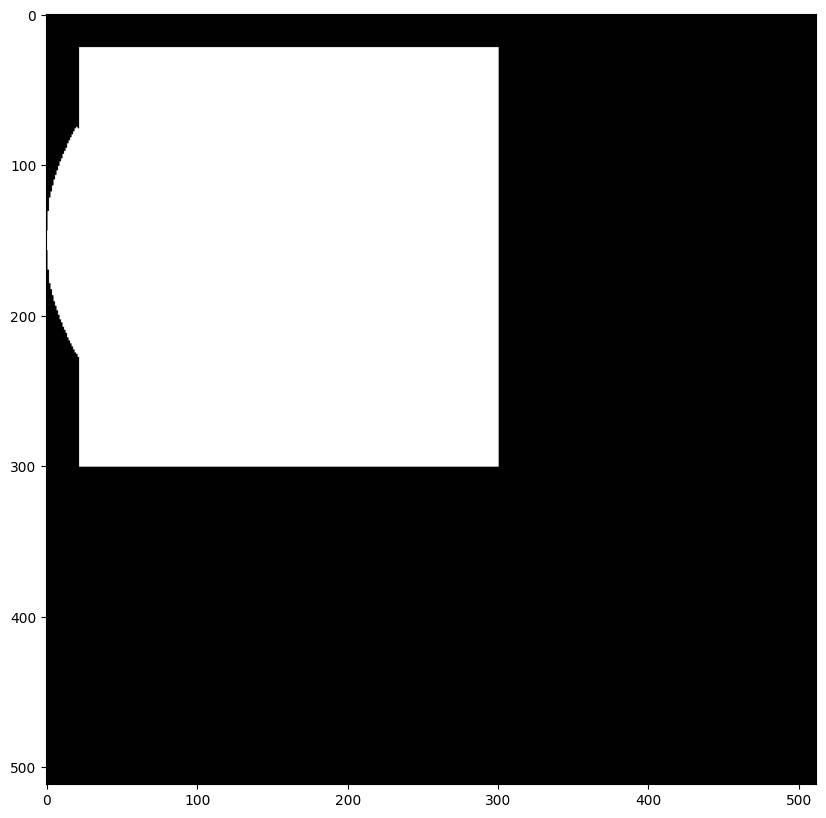

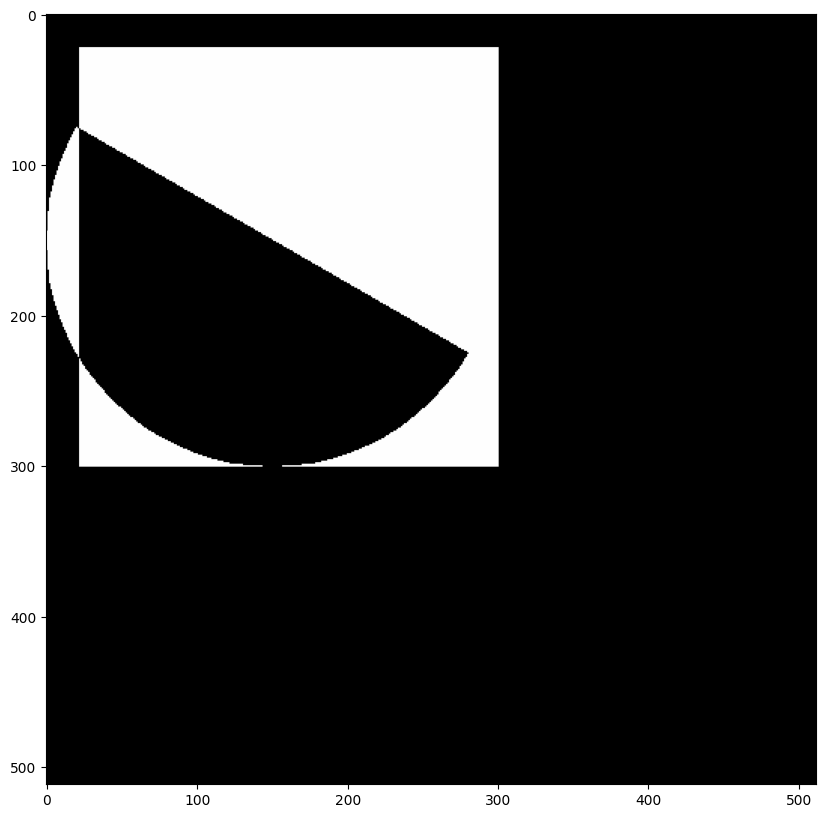

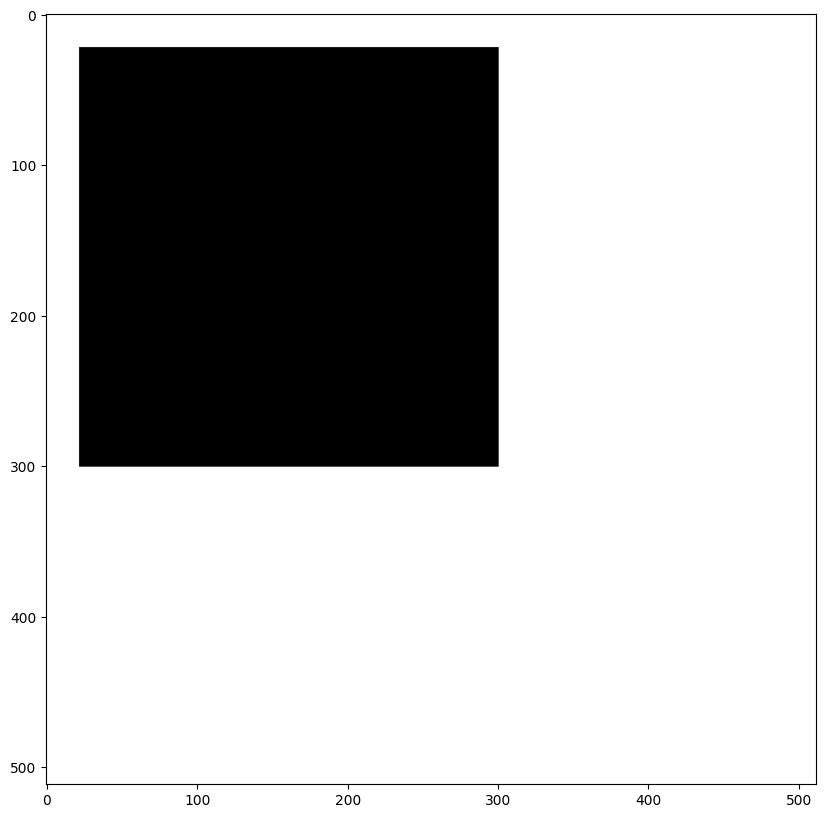

In [55]:
ad=cv2.bitwise_and(copy1,copy2)
show(ad)
or1=cv2.bitwise_or(copy1,copy2)
show(or1)
xor1=cv2.bitwise_xor(copy1,copy2)
show(xor1)
ands=cv2.bitwise_not(copy1)
show(ands)

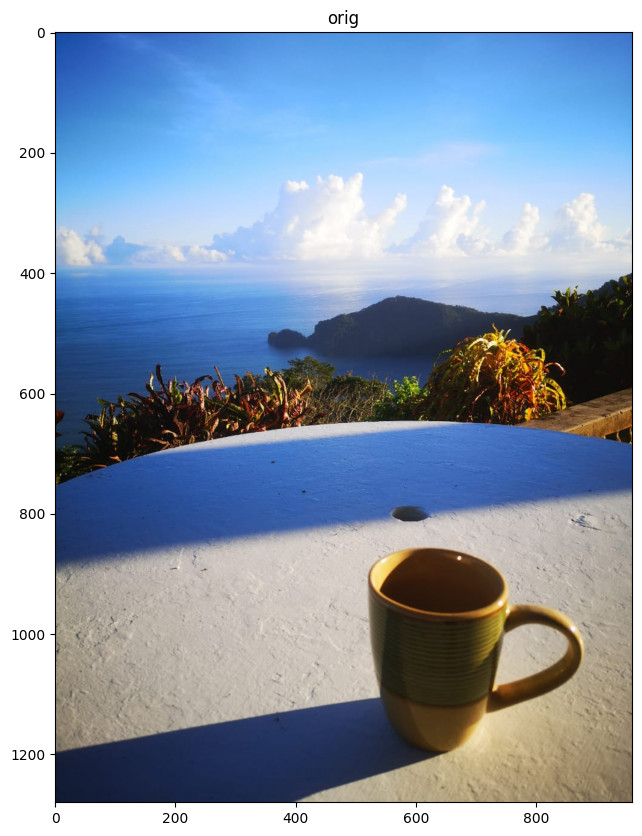

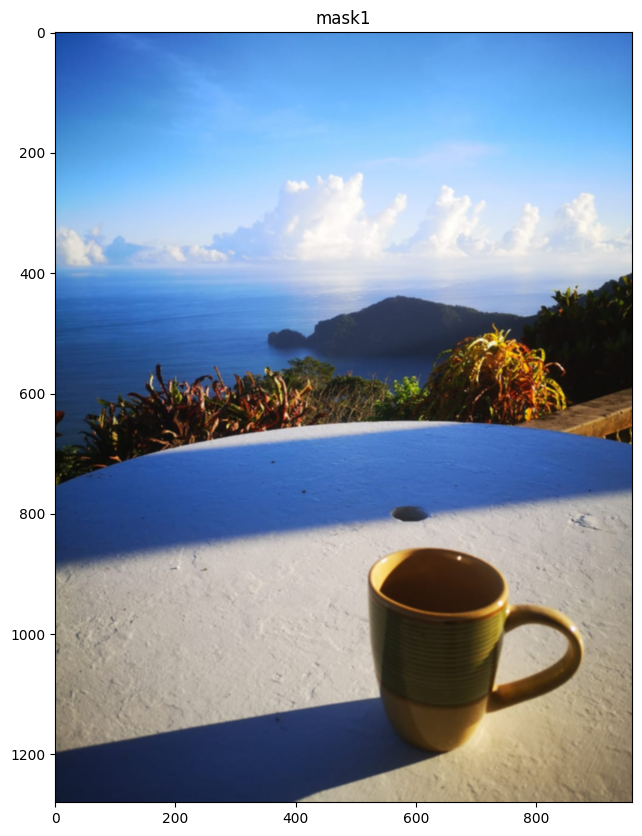

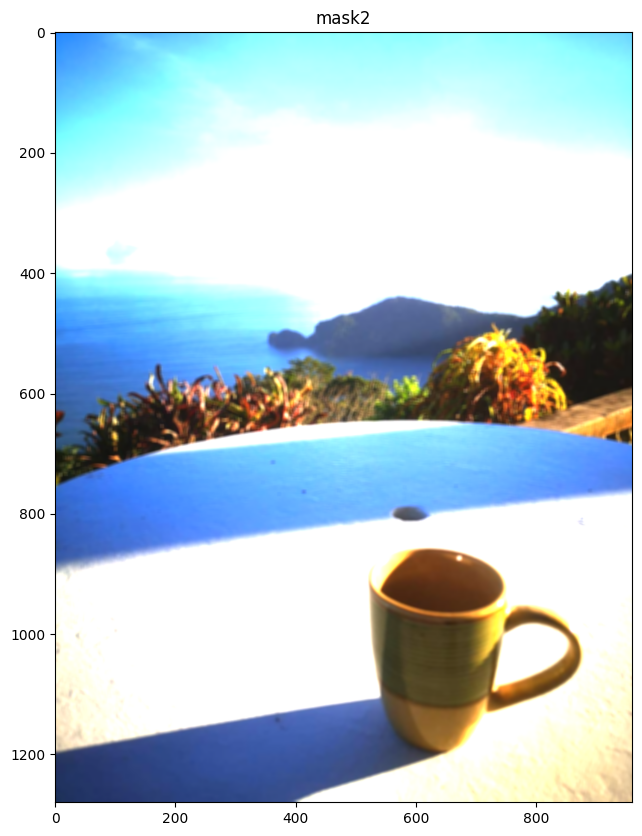

In [60]:
image=cv2.imread("/content/images/coffee_view.jpeg")
show(image,"orig")
mask=np.ones((3,3),np.float32)/9
mask2=np.ones((7,7),np.float32)/27
msk1=cv2.filter2D(image,-1,mask)
show(msk1,"mask1")
msk2=cv2.filter2D(image,-1,mask2)
show(msk2,"mask2")

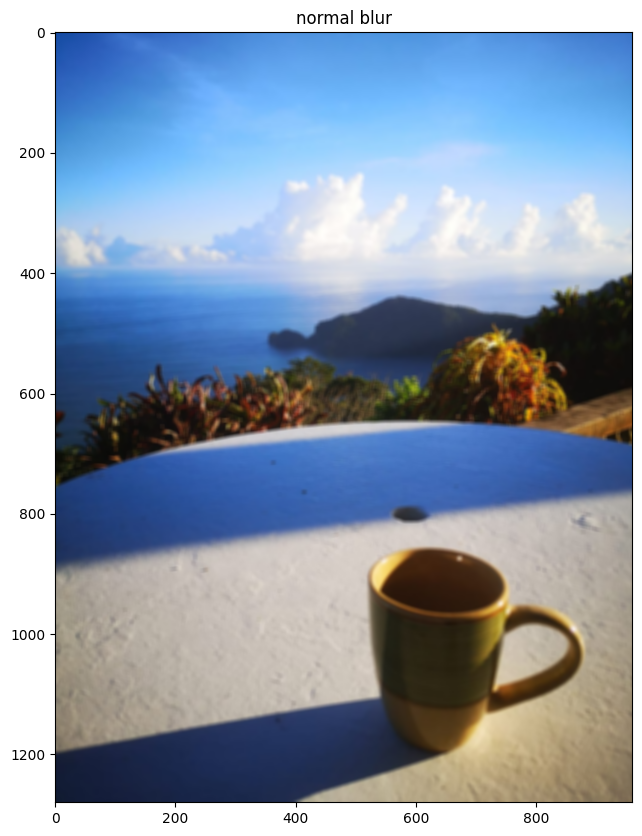

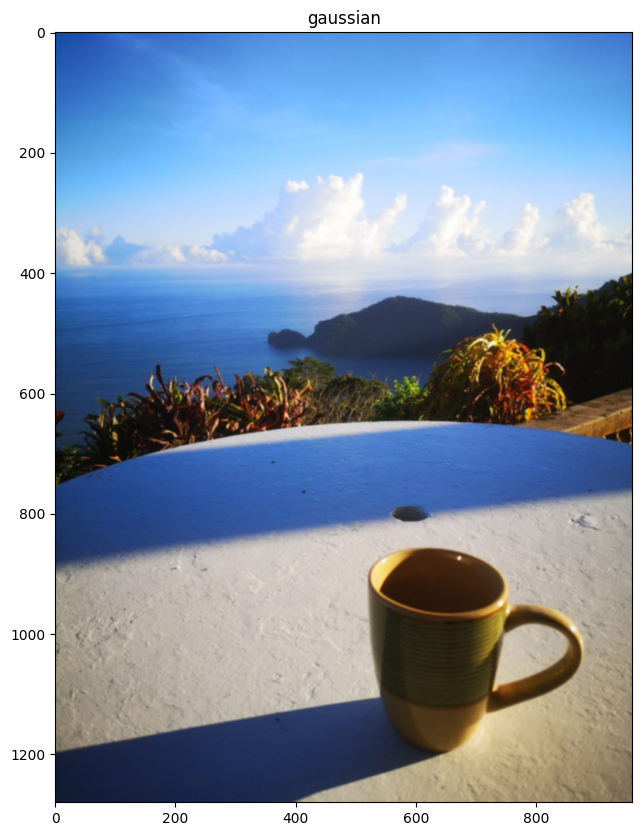

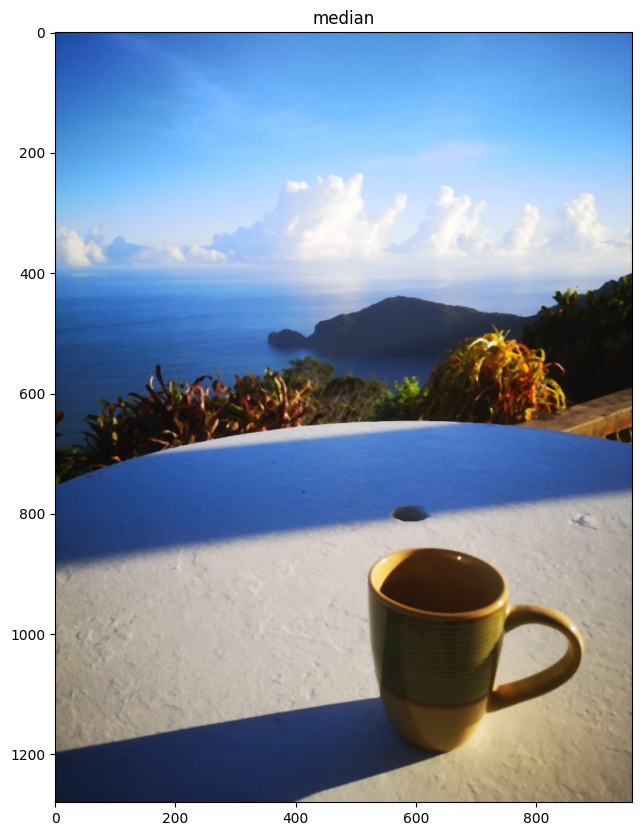

In [68]:
blur=cv2.blur(image,(8,8))
show(blur,"normal blur")
gb=cv2.GaussianBlur(image, (5,5), 0)
show(gb,"gaussian")
md=cv2.medianBlur(image, 5)
show(md,"median")

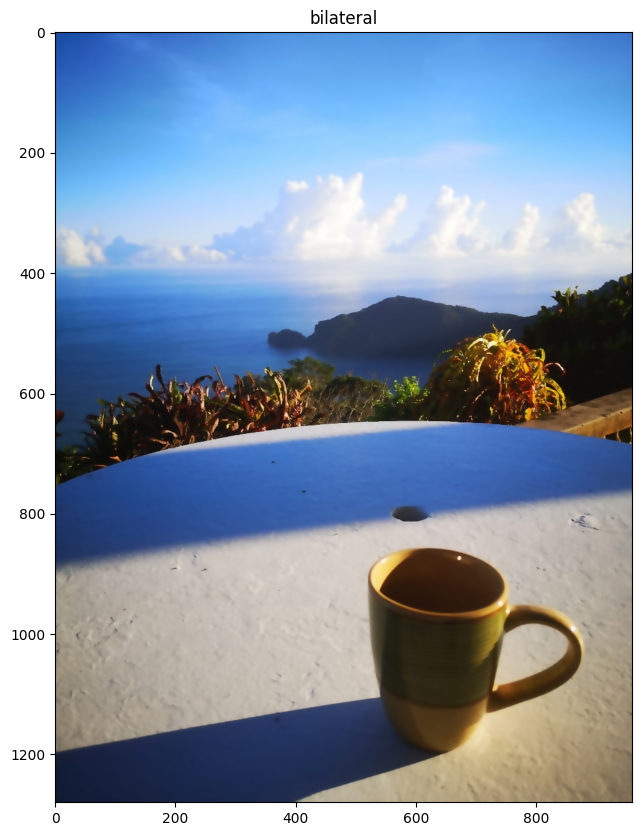

In [69]:
bilateral = cv2.bilateralFilter(image, 9, 75, 75)
show(bilateral,"bilateral")

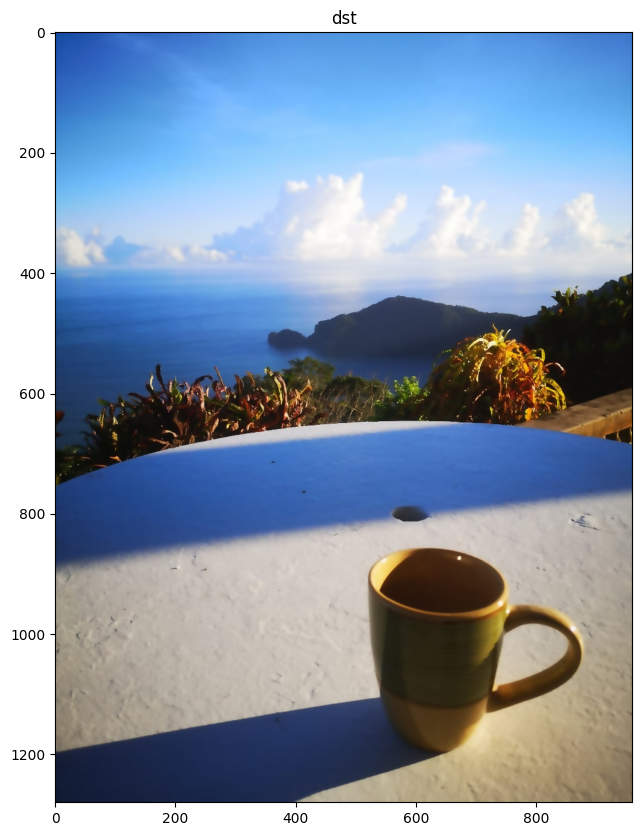

In [70]:
dst = cv2.fastNlMeansDenoisingColored(image, None, 6, 6, 7, 21)
show(bilateral,"dst")

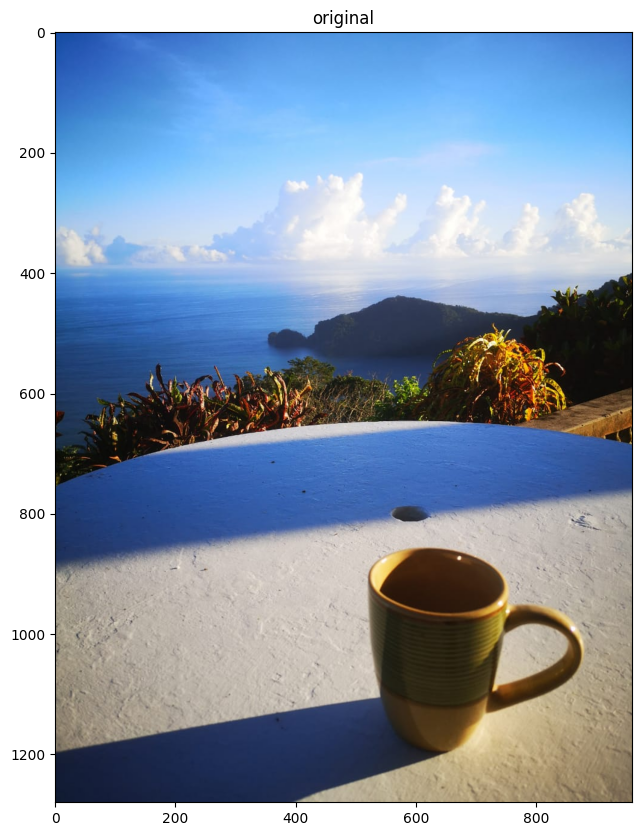

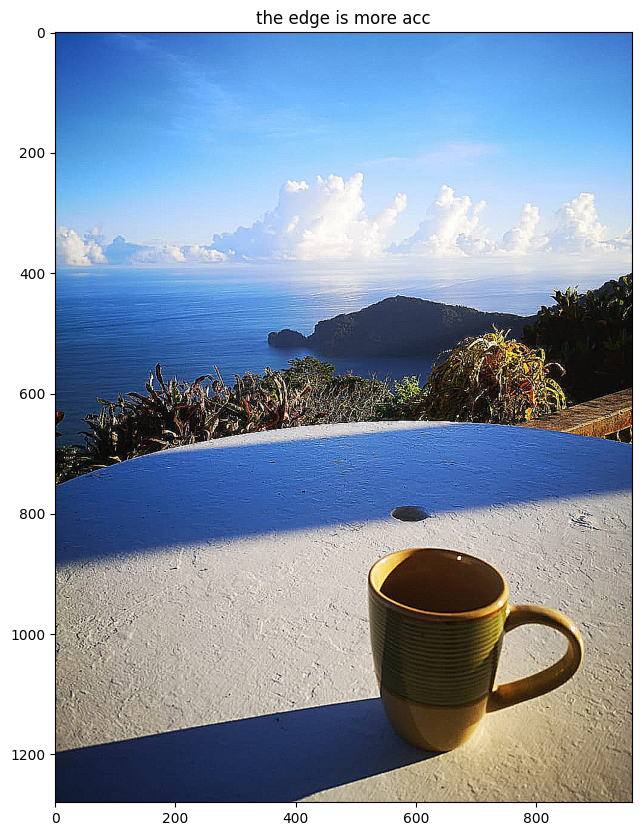

In [75]:
fil=np.array([[-1,-1,-1],
              [-1,9,-1],
              [-1,-1,-1]])
sk=cv2.filter2D(image,-1,fil)
show(image,"original")
show(sk,"the edge is more acc")

In [1]:
!wget https://raw.githubusercontent.com/rajeevratan84/ModernComputerVision/main/scan.jpeg

--2023-04-20 19:59:44--  https://raw.githubusercontent.com/rajeevratan84/ModernComputerVision/main/scan.jpeg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 171933 (168K) [image/jpeg]
Saving to: ‘scan.jpeg’

scan.jpeg           100%[===================>] 167.90K  --.-KB/s    in 0.02s   

2023-04-20 19:59:44 (10.3 MB/s) - ‘scan.jpeg’ saved [171933/171933]



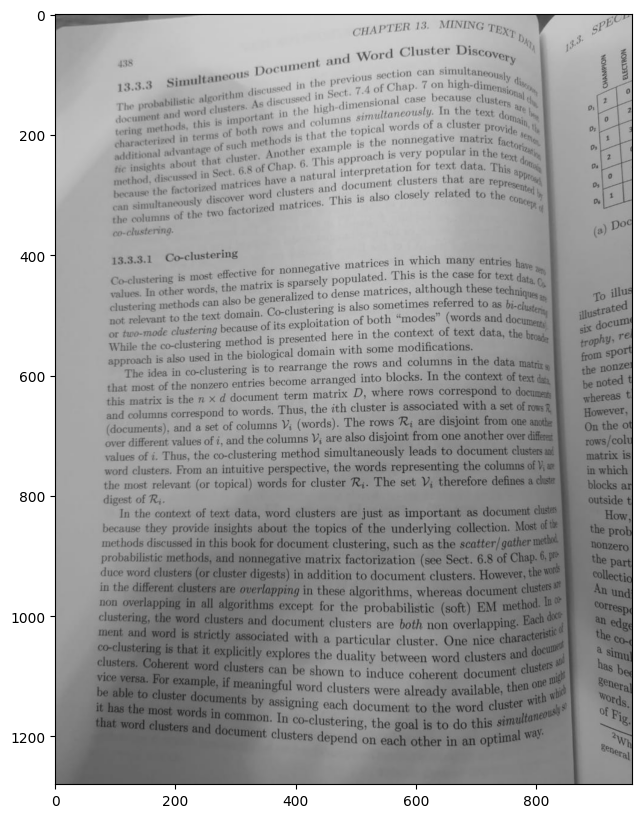

In [6]:
image = cv2.imread('scan.jpeg',0)
show(image)

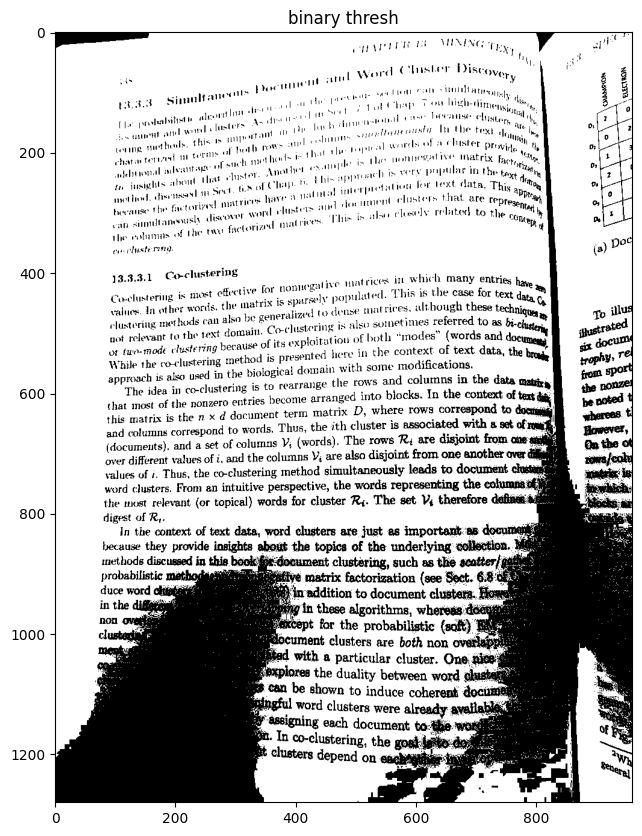

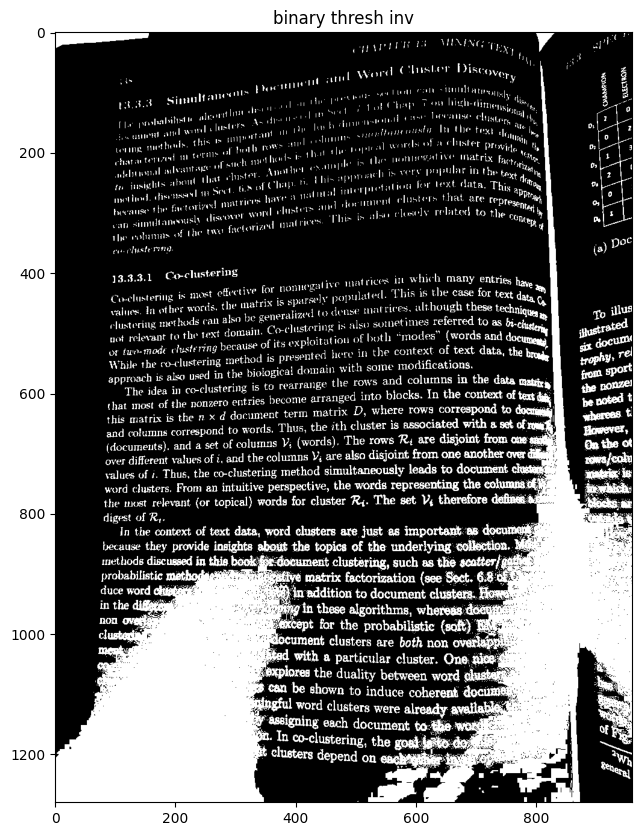

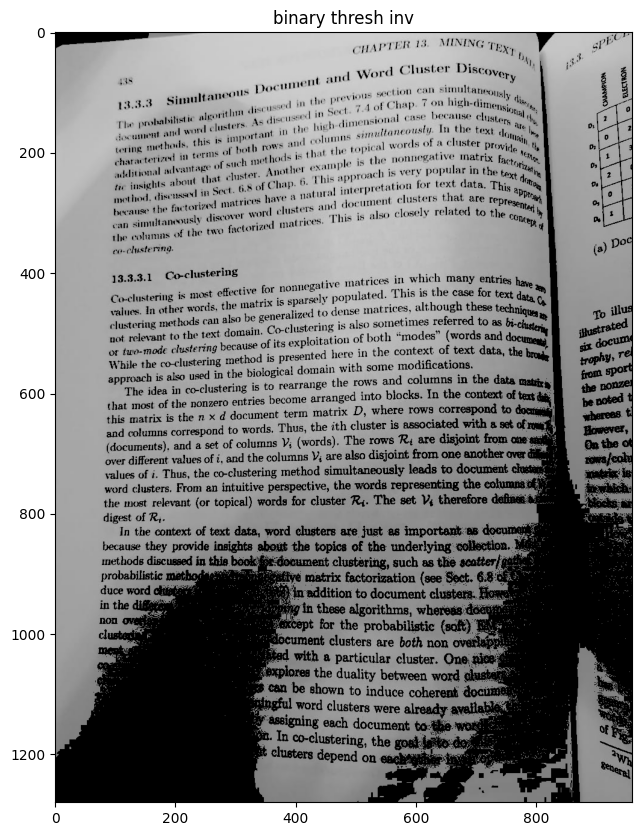

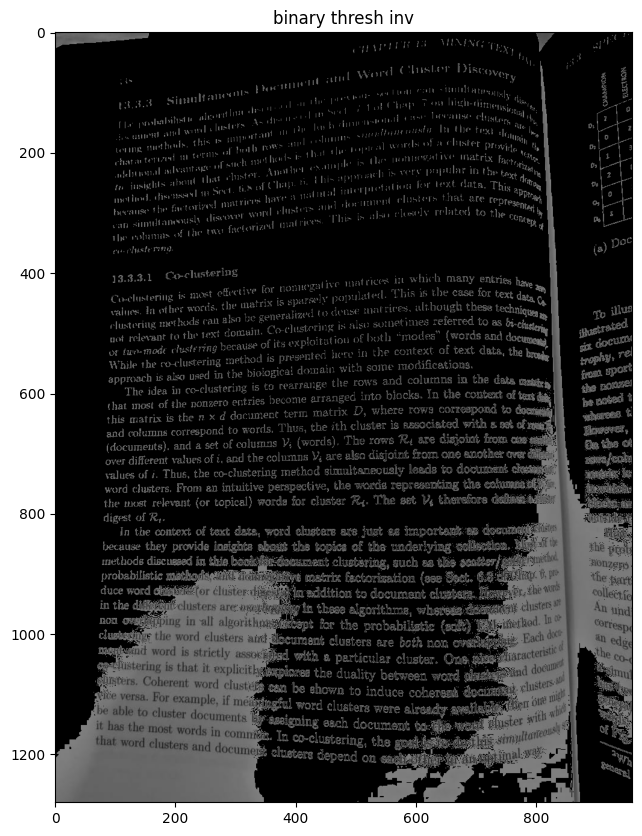

In [20]:
ret,binary=cv2.threshold(image,127,255,cv2.THRESH_BINARY)
show(binary,"binary thresh")
ret,binary_inv=cv2.threshold(image,127,255,cv2.THRESH_BINARY_INV)
show(binary_inv,"binary thresh inv")
ret,tozero=cv2.threshold(image,127,255,cv2.THRESH_TOZERO)
show(tozero,"binary thresh inv")
ret,tozero_inv=cv2.threshold(image,127,255,cv2.THRESH_TOZERO_INV)
show(tozero_inv,"binary thresh inv")

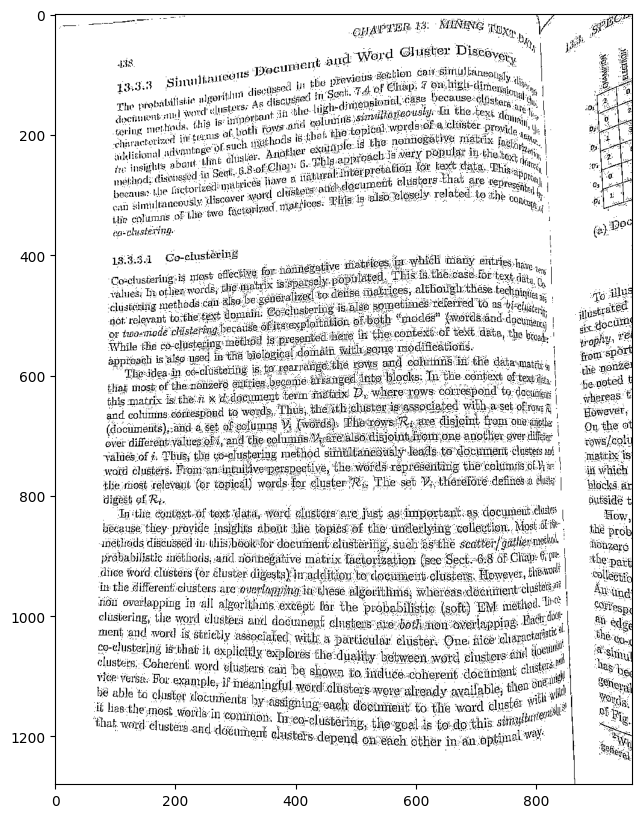

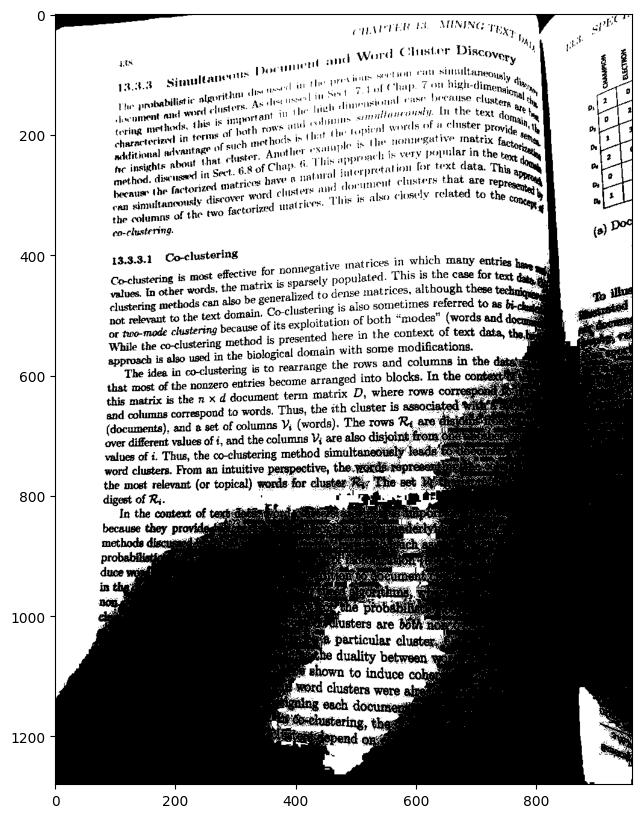

In [25]:
adap=cv2.adaptiveThreshold(image,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,3,5)
show(adap)
ret,to=cv2.threshold(image,127,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
show(to)

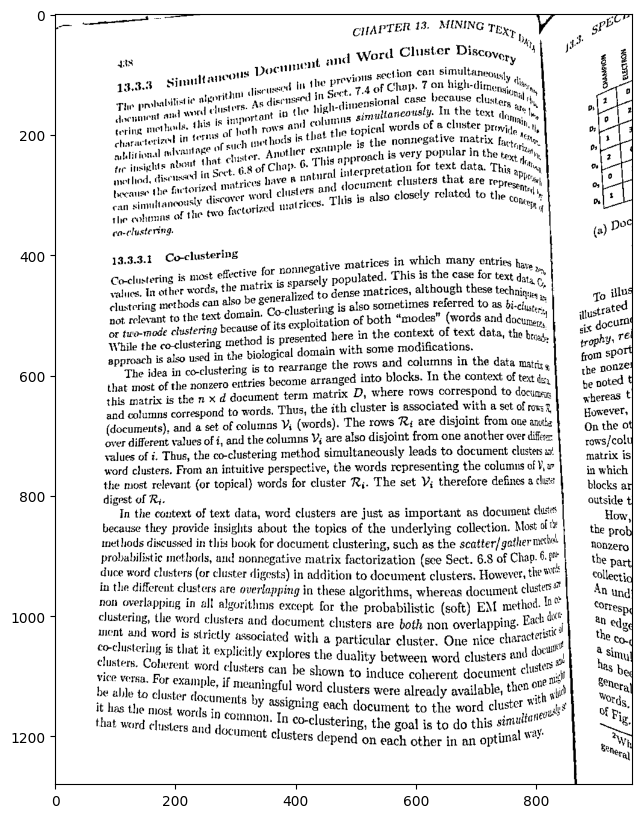

In [27]:
from skimage.filters import threshold_local
image = cv2.imread('scan.jpeg')

V = cv2.split(cv2.cvtColor(image, cv2.COLOR_BGR2HSV))[2]
T = threshold_local(V, 25, offset=15, method="gaussian")

thresh = (V > T).astype("uint8") * 255
show( thresh)

In [28]:
!wget https://moderncomputervision.s3.eu-west-2.amazonaws.com/images.zip
!unzip -qq images.zip

--2023-04-20 20:32:42--  https://moderncomputervision.s3.eu-west-2.amazonaws.com/images.zip
Resolving moderncomputervision.s3.eu-west-2.amazonaws.com (moderncomputervision.s3.eu-west-2.amazonaws.com)... 52.95.142.70
Connecting to moderncomputervision.s3.eu-west-2.amazonaws.com (moderncomputervision.s3.eu-west-2.amazonaws.com)|52.95.142.70|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 29586716 (28M) [application/zip]
Saving to: ‘images.zip’

images.zip          100%[===================>]  28.22M  13.0MB/s    in 2.2s    

2023-04-20 20:32:45 (13.0 MB/s) - ‘images.zip’ saved [29586716/29586716]



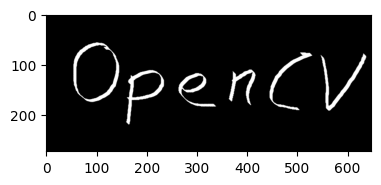

In [30]:
image = cv2.imread('images/opencv_inv.png', 0)


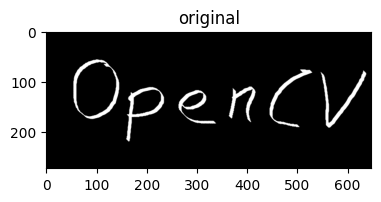

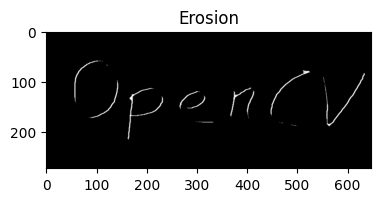

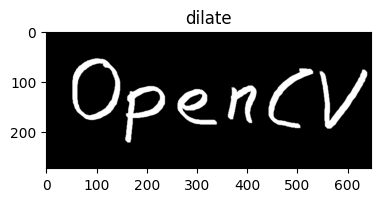

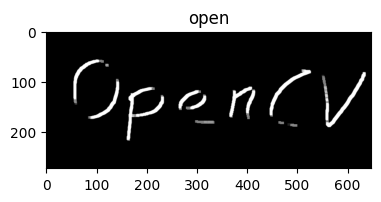

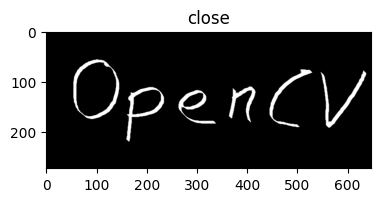

In [33]:
show(image,"original")
kernal=np.ones((5,5),np.uint8)
erosion=cv2.erode(image,kernal,iterations=1)
show(erosion,'Erosion')
dilate=cv2.dilate(image,kernal,iterations=1)
show(dilate,"dilate")
open=cv2.morphologyEx(image,cv2.MORPH_OPEN,kernal)
show(open,"open")
close=cv2.morphologyEx(image,cv2.MORPH_CLOSE,kernal)
show(close,"close")

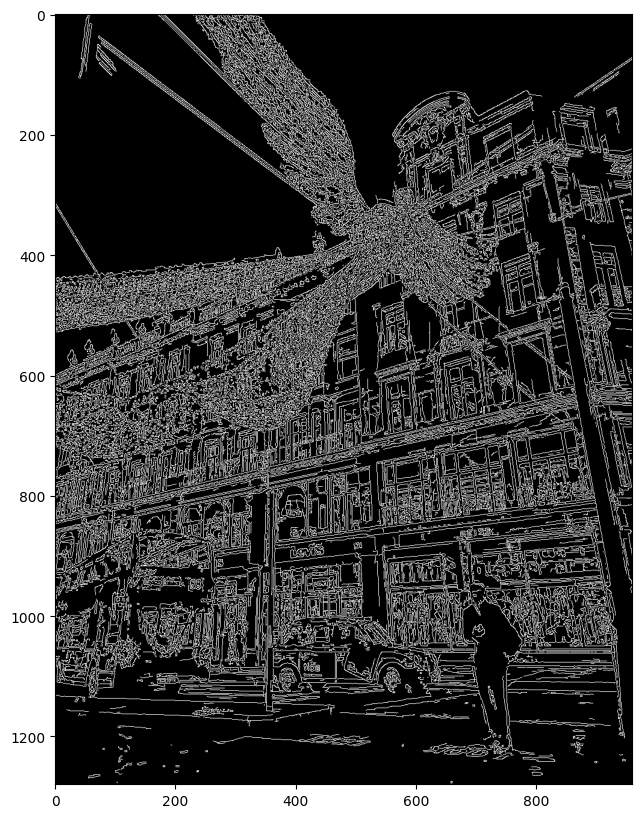

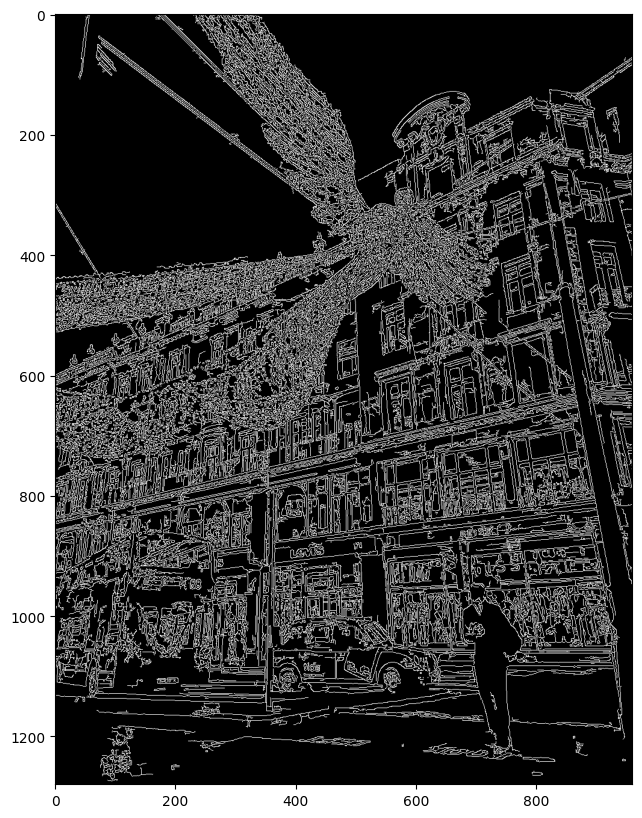

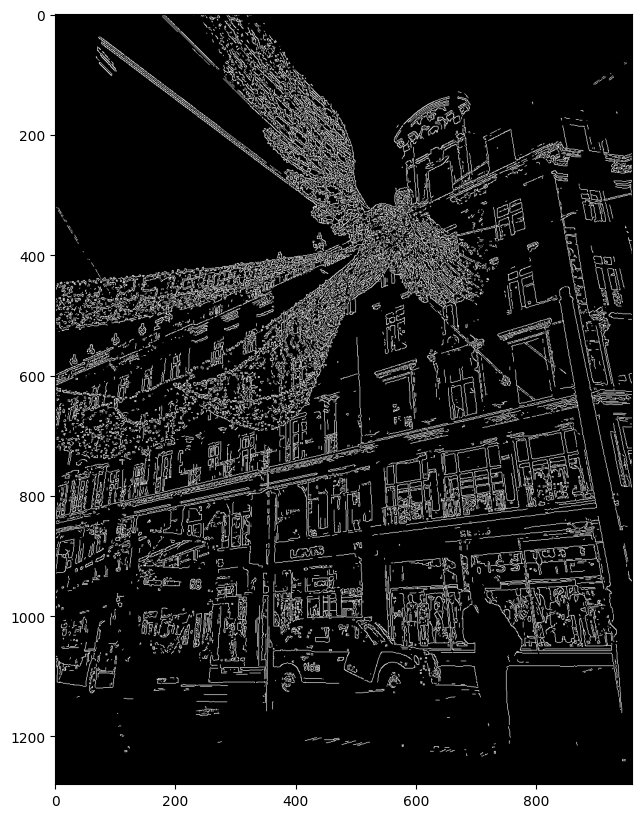

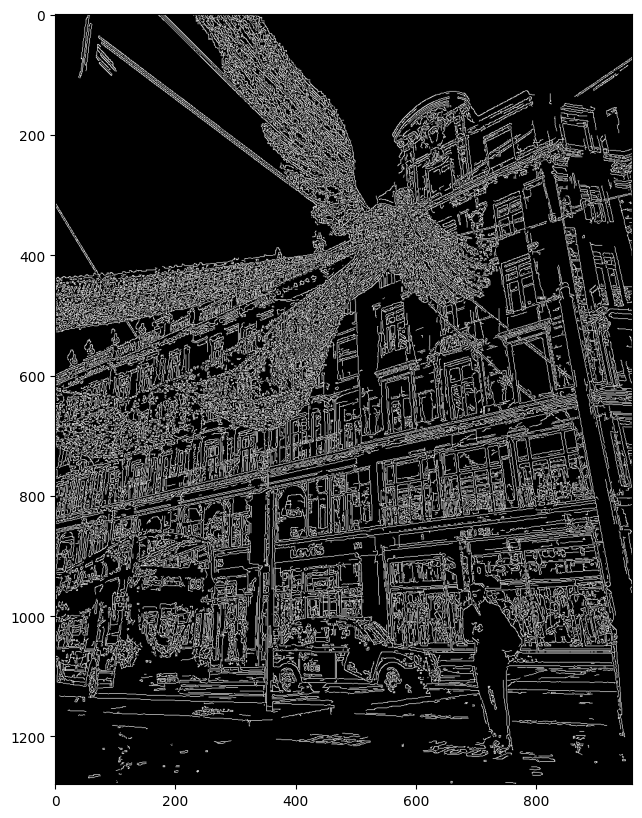

In [36]:
image = cv2.imread('images/londonxmas.jpeg',0)

# Canny Edge Detection uses gradient values as thresholds
# The first threshold gradient
canny = cv2.Canny(image, 50, 120)
show(canny,"canny1")
# Wide edge thresholds expect lots of edges
canny = cv2.Canny(image, 10, 200)
show(canny,"narrow")

# Narrow threshold, expect less edges 
canny = cv2.Canny(image, 200, 240)
show(canny,"wide")

canny = cv2.Canny(image, 60, 110)
show(canny,"canny4")


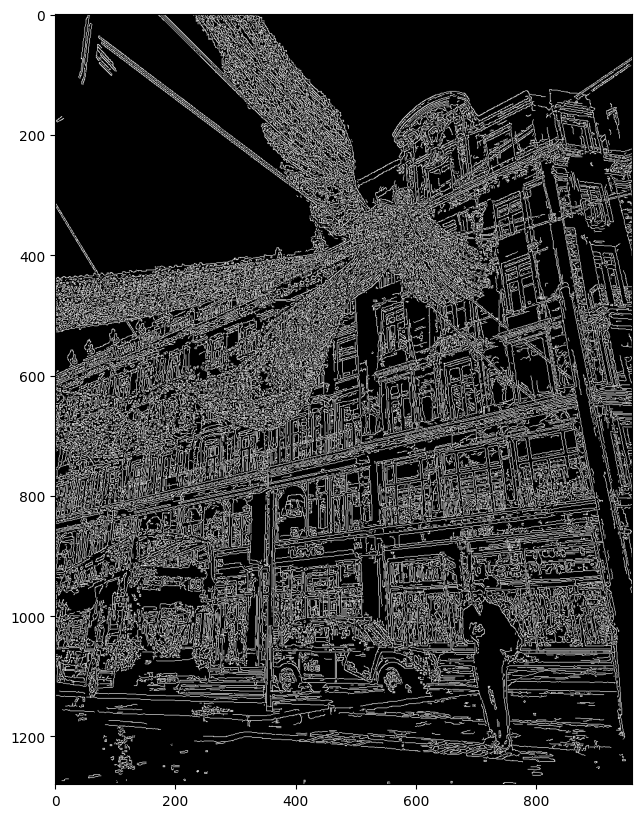

In [37]:
def autoCanny(image):
  # Finds optimal thresholds based on median image pixel intensity
  blurred_img = cv2.blur(image, ksize=(5,5))
  med_val = np.median(image) 
  lower = int(max(0, 0.66 * med_val))
  upper = int(min(255, 1.33 * med_val))
  edges = cv2.Canny(image=image, threshold1=lower, threshold2=upper)
  return edges

auto_canny = autoCanny(image)
show(auto_canny)